# Group Project  
**Members:** Clastina Figer, Kajal Singh  
**Dataset Chosen:** Weather Image Recognition (Kaggle Image Dataset); Source: Weather Dataset (Kaggle) — Jehan Bhathena https://www.kaggle.com/datasets/jehanbhathena/weather-dataset 

---

### Notebook Scope

This notebook includes the complete pipeline for our weather image classification project, structured across two main phases:


### **Phase 1 – Data Exploration and Preparation**  
Covers loading and inspecting the image dataset, label encoding, and applying data augmentation using `ImageDataGenerator`.  
Key steps:
- Dataset overview and structure validation
- Class distribution and sample visualization
- Data augmentation (rotation, shift, flip, zoom, rescale)
- 80/20 train-validation split using `validation_split`

### **Phase 2 – Feature Extraction and Traditional ML Modeling**  
In this phase, we combine a **custom CNN-based Autoencoder** for feature extraction with **traditional machine learning models** **(Random Forest Classifier + XG Boost)** for classification.  
Key steps:
- Autoencoder architecture and training
- Feature extraction from encoder bottleneck
- Dimensionality reduction using PCA (initially considered) and t-SNE for visualization
- Model training using Random Forest and XGBoost (with SMOTE and tuning)
- Performance evaluation using classification reports, interactive confusion matrices, and ROC-AUC

 **Note:**  
This notebook contains the **complete workflow for the final hybrid architecture**, combining deep learning for unsupervised feature learning and classical models for supervised classification.



In [3]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image


### Step 1: Loading Image Paths and Labels

We walk through the dataset directory and extract image paths and labels based on folder names.


                                           File_Path   Labels
0  C:\Users\Dell\Downloads\weather_dataset\datase...     hail
1  C:\Users\Dell\Downloads\weather_dataset\datase...      dew
2  C:\Users\Dell\Downloads\weather_dataset\datase...     rime
3  C:\Users\Dell\Downloads\weather_dataset\datase...     rime
4  C:\Users\Dell\Downloads\weather_dataset\datase...  fogsmog


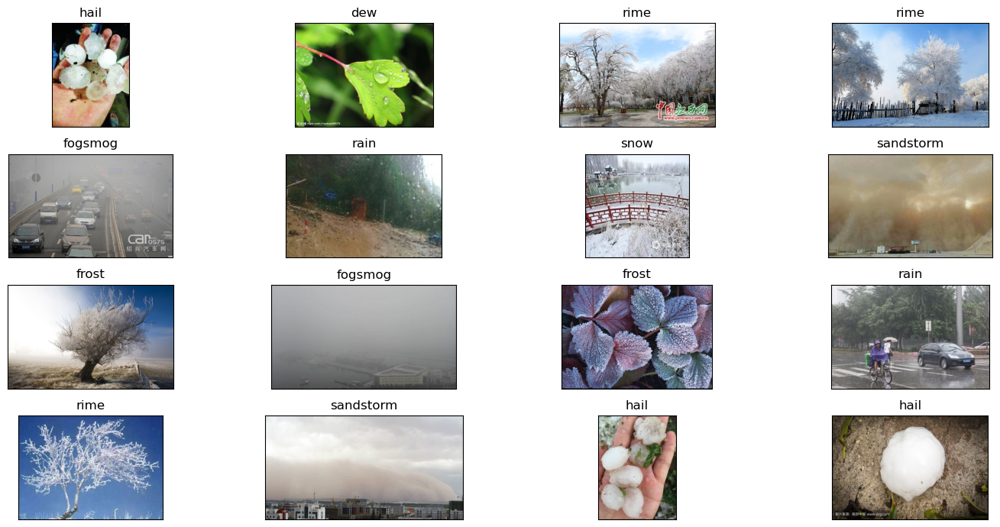

In [4]:
# Set dataset path (same as your unzipped folder name)

base_dir = r'C:\Users\Dell\Downloads\weather_dataset\dataset'


# Gather all image paths and their labels
path_imgs = []
for root, dirs, files in os.walk(base_dir):
    for file in files:
        if file.endswith(('.png', '.jpg', '.jpeg')):
            path_imgs.append(os.path.join(root, file))

# Extract labels from the folder names
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], path_imgs))

# Create a DataFrame
file_path = pd.Series(path_imgs, name='File_Path').astype(str)
labels = pd.Series(labels, name='Labels')
data = pd.concat([file_path, labels], axis=1)
data = data.sample(frac=1).reset_index(drop=True)

# Display first few rows
print(data.head())

# Visualize a grid of sample images
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 7),
                         subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    if i < len(data):
        img = plt.imread(data.File_Path[i])
        ax.imshow(img)
        ax.set_title(data.Labels[i])
plt.tight_layout()
plt.show()


# Step 2 Exploratory Data Analysis

### Step 2.1: Class Distribution

We examine how many images are available per weather class to understand class imbalance before modeling.


In [5]:
# Count images per class
class_counts = data['Labels'].value_counts()
class_percentages = (class_counts / class_counts.sum() * 100).round(2)

# Combine into a single DataFrame for annotation
class_summary = pd.DataFrame({
    'Class': class_counts.index,
    'Image Count': class_counts.values,
    'Percentage': class_percentages.values
})


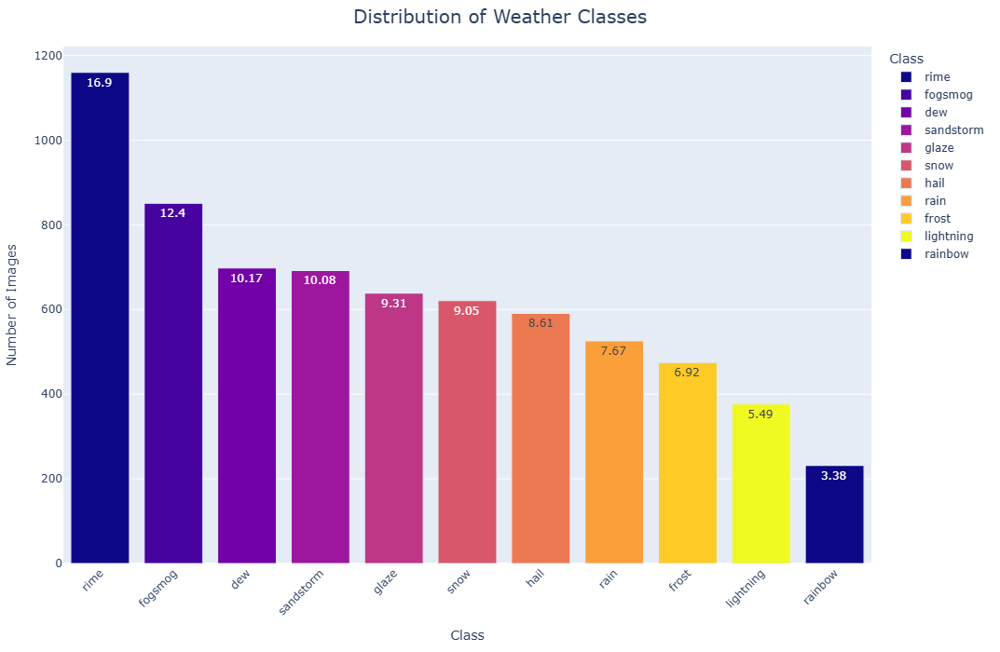

In [6]:
import plotly.express as px

fig = px.bar(
    class_summary,
    x='Class',            
    y='Image Count',
    text='Percentage',
    color='Class',        
    color_discrete_sequence=px.colors.sequential.Plasma,
    title='Distribution of Weather Classes'
)

fig.update_layout(
    width=1050,                
    height=700,                
    xaxis_tickangle=-45,
    yaxis_title='Number of Images',
    title_x=0.5,
    title_font_size=20,
    margin=dict(t=50, b=50, l=30, r=30),
    uniformtext_minsize=10,
    uniformtext_mode='hide'
)

fig.update_traces(marker_line_width=1.2)
fig.show()

### Step 2.1.1: Class Distribution – Analysis

As part of our exploratory data analysis, we reviewed the distribution of images across the 11 weather classes. Understanding class imbalance early is important in multi-class classification tasks, as it influences how well a model learns from underrepresented categories.

The bar chart above shows both the number and percentage of images per class. Percentages are displayed above each bar for clarity.

#### Key Observations:

- **Rime** is the most represented class, making up approximately **16.9%** of the dataset.
- **Rainbow** is the least represented class, with just **3.38%** of total images.
- Other underrepresented classes include **lightning (5.49%)** and **frost (6.92%)**, which may not offer enough examples for reliable pattern learning.
- The distribution is clearly imbalanced, with a long tail of low-frequency classes.

#### Why This Matters:

- Models trained on imbalanced data often favor the majority classes and overlook rare ones.
- This is especially problematic when all classes are equally important in the prediction task, as is the case here.

#### How We'll Address It:

- Use **stratified sampling** to preserve class proportions during train-validation splits.
- Apply **targeted data augmentation** to boost the training representation of classes like rainbow and lightning.
- Use **class weighting** in model training so that misclassifying minority classes carries a higher penalty.
- Consider **oversampling methods** (e.g., SMOTE) only if we extract tabular features later on, as SMOTE is not directly applicable to raw image data.

This class-level insight informed key decisions in both our data preprocessing and modeling pipeline.


### Step 2.1.2 Minority Class Analysis: <5% Representation

In [7]:
minority_classes = class_summary[class_summary['Percentage'] < 5]
print("Classes with <5% representation:\n", minority_classes)


Classes with <5% representation:
       Class  Image Count  Percentage
10  rainbow          232        3.38


### Minority Class Identification: <5% Representation

From our earlier class distribution analysis, we identified weather classes that make up **less than 5%** of the dataset. These are considered **minority classes**, which can introduce class imbalance issues during model training.

#### Underrepresented Class

| Class    | Image Count | Percentage |
|----------|-------------|------------|
| Rainbow  | 232         | 3.38%      |

#### Why This Is Important

- **Rainbow** is significantly underrepresented compared to other classes.
- In a multi-class classification setup, such imbalance can cause the model to underperform on rare classes or even ignore them entirely.
- This is especially problematic when each class is equally important in the prediction task, as is the case here.

#### How We Plan to Handle It

To help the model learn minority classes more effectively, we plan to:

- Apply **targeted data augmentation** (e.g., flipping, brightness changes, color shifts) to increase variation and representation for rainbow images.
- Use **class weighting** during training, so that the model places more emphasis on correctly classifying underrepresented classes.
- If we explore traditional feature-based models later (e.g., using PCA or embeddings), we may consider **oversampling methods like SMOTE**, though it is not directly applicable to raw image data.

Identifying this imbalance early allows us to build a training strategy that promotes **fairness across all classes** and improves overall generalization.


### Step 2.2: Image Size Distribution

We analyze the distribution of image widths and heights to decide on a consistent resizing strategy for our model and to avoid image distortion.


In [8]:
from PIL import Image
import numpy as np

# Sample a subset of images to analyze size (for performance)
sample_paths = data['File_Path'].sample(n=300, random_state=42)

widths, heights = [], []

for path in sample_paths:
    try:
        with Image.open(path) as img:
            w, h = img.size
            widths.append(w)
            heights.append(h)
    except:
        continue  # Skip corrupted images

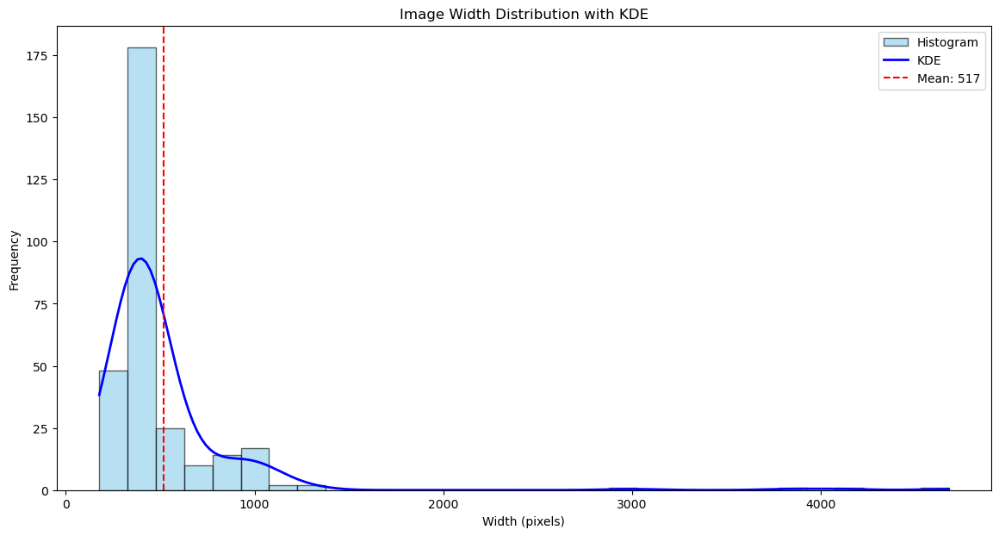

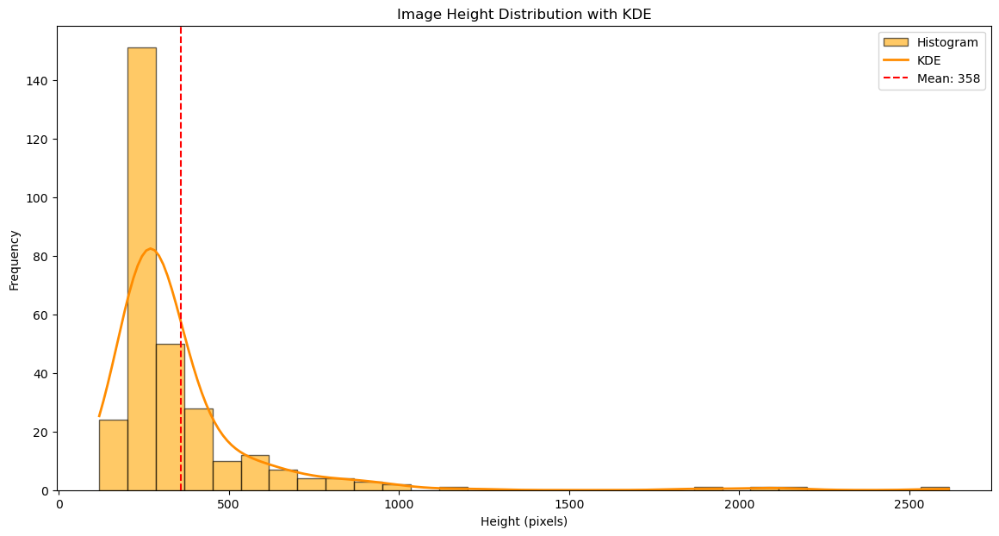

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Compute KDE for widths
x_width = np.linspace(min(widths), max(widths), 200)
kde_width = gaussian_kde(widths)
y_width = kde_width(x_width) * len(widths) * (max(widths) - min(widths)) / 30

# Plot width distribution
plt.figure(figsize=(14, 7))
plt.hist(widths, bins=30, color='skyblue', edgecolor='black', alpha=0.6, label='Histogram')
plt.plot(x_width, y_width, color='blue', lw=2, label='KDE')
plt.axvline(np.mean(widths), color='red', linestyle='--', label=f"Mean: {np.mean(widths):.0f}")
plt.title("Image Width Distribution with KDE")
plt.xlabel("Width (pixels)")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# Compute KDE for heights
x_height = np.linspace(min(heights), max(heights), 200)
kde_height = gaussian_kde(heights)
y_height = kde_height(x_height) * len(heights) * (max(heights) - min(heights)) / 30

# Plot height distribution
plt.figure(figsize=(14, 7))
plt.hist(heights, bins=30, color='orange', edgecolor='black', alpha=0.6, label='Histogram')
plt.plot(x_height, y_height, color='darkorange', lw=2, label='KDE')
plt.axvline(np.mean(heights), color='red', linestyle='--', label=f"Mean: {np.mean(heights):.0f}")
plt.title("Image Height Distribution with KDE")
plt.xlabel("Height (pixels)")
plt.ylabel("Frequency")
plt.legend()
plt.show()


### Step 2.2: Image Dimension Distribution Analysis

To assess the variation in image sizes across the dataset, we analyzed the distributions of **image widths** and **heights** using a sample of 300 images. This step helps inform how we preprocess inputs before feeding them into CNN-based models like MobileNetV2.

#### Key Observations

- **Image Widths**  
  The width distribution is **right-skewed**, with the majority of images falling between **200 and 600 pixels**. The mean width is approximately **519 pixels** (shown as a red dashed line). A smaller number of images extend beyond **1000 pixels**, with rare outliers reaching up to **4000 pixels**.

- **Image Heights**  
  The height distribution shows a similar pattern. Most images fall between **200 and 500 pixels**, with a mean height of approximately **371 pixels**. Heights above **1000 pixels** are uncommon but present.

#### Why This Matters

CNNs like MobileNetV2 require all input images to be resized to the same shape. Feeding images of different resolutions would result in **dimension mismatch errors** and inconsistent feature learning. Additionally, large image outliers can increase GPU memory usage and training time without adding much value.

#### How We Handled It

- All images were resized to a fixed size of **256×256 pixels** during preprocessing. This resolution offers a good trade-off between detail and efficiency.
- We did not preserve aspect ratio in this implementation, but techniques such as padding or cropping could be explored in future iterations to avoid stretching or distortion.


### Step 2.3: Image Properties — Size, Color Mode & Brightness

In this step, we explored structural properties of the image dataset, which are crucial for building a reliable preprocessing and modeling pipeline.

In [10]:
from PIL import Image
from collections import Counter

dimensions = []
for path in data['File_Path'].sample(500):  # sample for speed
    try:
        img = Image.open(path)
        dimensions.append(img.size)
    except:
        pass

dim_counts = Counter(dimensions)
print("Most common image sizes:", dim_counts.most_common(5))


Most common image sizes: [((400, 266), 75), ((400, 300), 32), ((400, 265), 12), ((426, 240), 10), ((1200, 800), 8)]


These results show:
- Considerable variation in image resolution, with many widths falling between **400 and 600 pixels**.
- This variation can create issues during model training, as convolutional neural networks (CNNs) require a fixed input shape.

**Action**: We will resize all images to a uniform shape of **256×256** before feeding them into our CNN model (MobileNetV2).


### Step 2.4: Color Mode Distribution

In [11]:
modes = [Image.open(p).mode for p in data['File_Path'].sample(500)]
pd.Series(modes).value_counts()


RGB     486
L        10
RGBA      4
Name: count, dtype: int64

Out of 500 sampled images:
- `RGB`: 486 images
- `RGBA`: 4 images
- `L` (Grayscale): 10 images

**Observation**:
- Majority of the dataset is in RGB format.
- A small number of images are either grayscale or include alpha transparency (`RGBA`).

 **Action**:
- Convert all images to RGB format to ensure uniform 3-channel input to CNNs.

### Step 2.5: Brightness Distribution Analysis

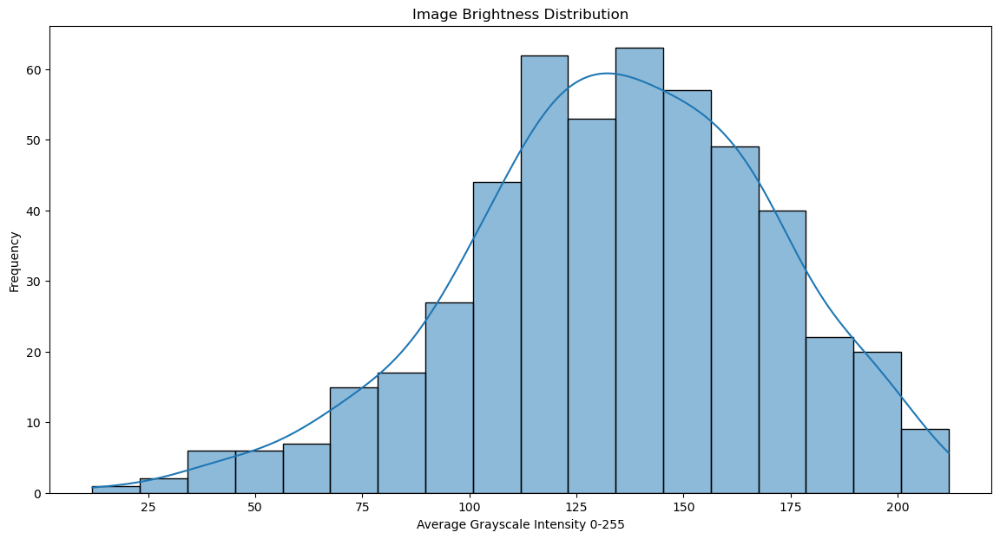

In [16]:
from PIL import Image
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

brightness_values = []

for path in data['File_Path'].sample(500):
    try:
        img = Image.open(path).convert('L')  # convert to grayscale
        brightness = np.array(img).mean()    # get average brightness
        brightness_values.append(brightness)
    except:
        continue

plt.figure(figsize=(14, 7))
sns.histplot(brightness_values, kde=True)
plt.title("Image Brightness Distribution")
plt.xlabel("Average Grayscale Intensity 0-255")
plt.ylabel("Frequency")
plt.show()


We extended our earlier grayscale brightness analysis by sampling 500 images and calculating the **average pixel intensity** (on a 0–255 scale) after converting each image to grayscale. The resulting histogram, overlaid with a KDE curve, shows how brightness is distributed across the dataset.

#### Key Observations:
- The brightness distribution follows a **roughly normal (bell-shaped)** curve.
- Most images have average brightness values between **100 and 170**, with a central tendency around **130–140**.
- Very few images fall on the extreme dark (<50) or bright (>200) ends of the spectrum.

#### Why This Matters:
- A balanced brightness distribution is desirable, as it ensures the model isn't biased toward overexposed or underexposed imagery.
- It also suggests the dataset includes a variety of weather conditions — bright (sunny, snow) and dull (fog, storm) — which is ideal for generalization.

#### Next Steps:
- We will **normalize pixel values** during preprocessing (`rescale=1./255`) to bring all images into a 0–1 range for consistency.
- **Data augmentation** (random brightness adjustments) may still be applied to further enhance the model’s robustness to lighting changes.

This confirms that the dataset’s brightness profile is suitable for model training with minimal risk of bias from uneven lighting.


### Step 2.6: Visual Inspection of Weather Classes


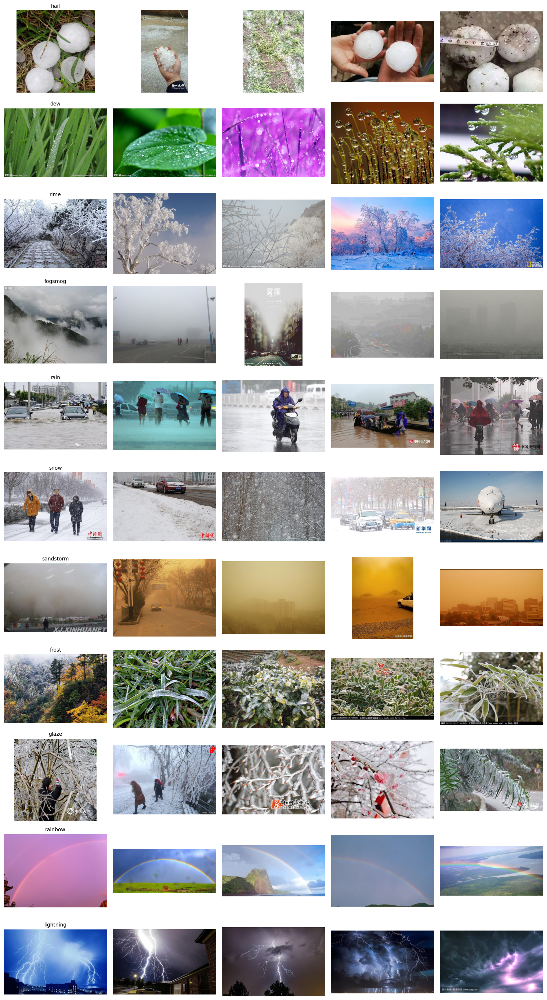

In [17]:
import matplotlib.pyplot as plt
import random

classes = data['Labels'].unique()
fig, axs = plt.subplots(len(classes), 5, figsize=(15, 2.5 * len(classes)))

for i, label in enumerate(classes):
    samples = data[data['Labels'] == label]['File_Path'].sample(5)
    for j, path in enumerate(samples):
        img = plt.imread(path)
        axs[i, j].imshow(img)
        axs[i, j].axis('off')
        if j == 0:
            axs[i, j].set_title(label, fontsize=10)

plt.tight_layout()
plt.show()


### Visual Sampling of Each Class

To better understand what the data actually looks like, we randomly sampled five images from each weather class and reviewed them in a grid format. This allowed us to:

- Check for consistency within each class
- Identify any mislabeled, duplicate, or low-quality images
- Observe how visually distinct or similar the classes appear

### Key Observations

- **Rime**, **snow**, and **glaze** appeared visually similar, often showing frozen surfaces or icy textures. These classes may be difficult for the model to separate reliably.
- **Fogsmog** images displayed very low visibility, making them more visually distinct and potentially easier to classify.
- **Lightning** samples featured strong contrast and brightness variation, which aligns with outliers seen in the earlier brightness distribution analysis.
- **Rain** images frequently included contextual cues such as streets, vehicles, or glass surfaces with droplets, which may assist the model in distinguishing them.
- **Rainbow** and **sandstorm** had more variability in scene composition, which could make them more difficult to classify consistently.

### Relevance of This Step

Conducting a manual review of image samples helped us validate the dataset beyond numerical summaries. It also provided useful insight into which classes are likely to be challenging for the model and which might benefit from further preprocessing support.

### Considerations Moving Forward

- We will monitor performance on classes that are visually similar (e.g., rime vs. glaze) and revisit label structure if needed.
- Further visual feature analysis (such as color distributions or edge detection) may help confirm visual overlap.
- Data augmentation strategies will be informed by these observations, such as introducing blur for foggy conditions or adjusting brightness for lightning.


# Step 3: Image Preprocessing and Data Generators

### Data Augmentation and Image Generators

To improve the generalization ability of our model and prevent overfitting, we apply **data augmentation** using `ImageDataGenerator`. This technique artificially increases the diversity of our training dataset by applying random but realistic transformations to the input images, such as:

- **Rotation:** Randomly rotates images within a specified range.
- **Width/Height Shifts:** Translates images horizontally or vertically.
- **Zoom:** Applies random zooming.
- **Horizontal Flip:** Mirrors images horizontally to simulate varied orientations.
- **Fill Mode:** Handles newly created pixels after transformation using nearest neighbor strategy.

We also normalize the pixel values by rescaling all images to the `[0, 1]` range.

The generator is split into:
- **Training generator**: Applies the full set of augmentations.
- **Validation generator**: Uses only rescaling (no augmentation) to evaluate the model on unaltered data.

This ensures that the model learns from a richer variety of data during training while being evaluated on consistent, clean inputs.



In [18]:
!pip install tensorflow

In [10]:
# Show class indices (label encoding)
print("Class indices:", train_gen.class_indices)

# Show a sample batch shape
batch_imgs, batch_labels = next(train_gen)
print("Batch image shape:", batch_imgs.shape)
print("Batch label shape:", batch_labels.shape)


Class indices: {'dew': 0, 'fogsmog': 1, 'frost': 2, 'glaze': 3, 'hail': 4, 'lightning': 5, 'rain': 6, 'rainbow': 7, 'rime': 8, 'sandstorm': 9, 'snow': 10}
Batch image shape: (32, 150, 150, 3)
Batch label shape: (32, 11)


In [19]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, UpSampling2D, 
                                     Cropping2D, BatchNormalization, GlobalAveragePooling2D, Reshape)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Path
dataset_path = r'C:\Users\Dell\Downloads\weather_dataset\dataset'

# Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

train_gen = train_datagen.flow_from_directory(
    dataset_path, target_size=(150, 150), batch_size=16,
    class_mode='input', subset='training'
)
val_gen = train_datagen.flow_from_directory(
    dataset_path, target_size=(150, 150), batch_size=16,
    class_mode='input', subset='validation'
)

Found 5493 images belonging to 11 classes.
Found 1369 images belonging to 11 classes.


In [ ]:
# Saving the cleaned dataset
data.to_csv('weather_image_metadata.csv', index=False)

To improve the model’s ability to generalize on unseen data and prevent overfitting, we applied a range of data augmentation techniques using `ImageDataGenerator`. This also helps simulate real-world variability in weather conditions captured in the image dataset.

#### Augmentation Techniques Applied:
- **Rescale**: Normalizes pixel values to the range [0, 1] using `rescale=1./255`.
- **Rotation Range**: Randomly rotates images within a 20-degree range to introduce viewpoint variations.
- **Width & Height Shift**: Translates images horizontally and vertically by 10% to simulate object movement.
- **Zoom Range**: Zooms in and out of images up to 20%, introducing scale invariance.
- **Horizontal Flip**: Randomly flips images horizontally to handle left-right orientation variations.
- **Fill Mode (Nearest)**: Fills empty pixels created during transformations using the nearest pixel values.

These transformations ensure that the model does not memorize exact patterns but instead learns general visual features relevant to each weather class.

#### Dataset Split:
We used an 80/20 split with the `validation_split` parameter:
- **Training Generator (`train_gen`)**: Loads and augments images for model training.
- **Validation Generator (`val_gen`)**: Loads a separate subset of images (without shuffling) for performance evaluation.

All images were resized to `(150, 150)` with a batch size of `16` for consistency across the pipeline.


---

# Phase 1 Summary: Data Preparation & Augmentation

In Phase 1, we focused on preparing the weather image dataset for effective model training by applying robust preprocessing and augmentation strategies.

### Dataset Cleaning & Structure:
- **Class Mapping:** The dataset consisted of 11 weather categories, each assigned a numerical class index.
- **Sample Shape:** Images were standardized to a size of `(150, 150, 3)` across all batches.
- **Dataset Split:** We used an 80/20 split for training and validation using the `validation_split` parameter of `ImageDataGenerator`.

### Augmentation Pipeline:
To enhance the model's generalization and simulate real-world variability, we implemented the following augmentations using Keras’ `ImageDataGenerator`

These augmentations ensured the model learns generalized patterns rather than memorizing specific image layouts.

###  Key Outcomes:
- A balanced, standardized dataset was created with **5493 training** and **1369 validation** images.
- The data pipeline was optimized for batch processing with consistent image dimensions and meaningful class labels.
- Augmentation techniques laid the foundation for extracting diverse and robust features in the next phase.

>  Phase 1 successfully established a clean, consistent, and diverse dataset that primed the deep learning pipeline for downstream feature extraction and classification.

---
---

# Phase 2- Autoencoders and Data Modeling

## 4.1 Autoencoder Design for Feature Extraction

In this section, we build and train a convolutional autoencoder to learn compressed feature representations of weather images. The motivation behind using an autoencoder is to extract meaningful, lower-dimensional features that capture the essence of each image, which can later be used as input to traditional machine learning classifiers.

This architecture follows an **encoder-decoder** structure:
- The **encoder** learns to reduce the image dimensions and capture abstract, compressed features.
- The **decoder** learns to reconstruct the original image from these compressed features, ensuring minimal loss of information.

By training the model to reconstruct images, we encourage the encoder to learn compact, informative features that are resilient to noise and irrelevant variations—making them highly suitable for downstream classification tasks.


In [13]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, UpSampling2D, 
                                     Cropping2D, BatchNormalization, GlobalAveragePooling2D, Reshape)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Encoder
input_img = Input(shape=(150, 150, 3))
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2), padding='same')(x)
encoded = GlobalAveragePooling2D()(x)

# After GlobalAveragePooling2D in encoder
x = Reshape((1, 1, 64))(encoded)
encoder_model = Model(input_img, encoded, name="encoder")

# Decoder
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)   # (2, 2)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((5, 5))(x)   # (10, 10)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((5, 5))(x)   # (50, 50)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((3, 3))(x)   # (150, 150)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

# Full model
autoencoder = Model(input_img, decoded, name="autoencoder")
autoencoder.compile(optimizer=Adam(1e-3), loss='mse', metrics=['accuracy'])

# Train
autoencoder.fit(train_gen, validation_data=val_gen, epochs=25)

# Save
autoencoder.save("autoencoder_model.keras")
encoder_model.save("encoder_model.keras")


Found 5493 images belonging to 11 classes.
Found 1369 images belonging to 11 classes.


C:\Users\Dell\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 180s 505ms/step - accuracy: 0.5652 - loss: 0.0424 - val_accuracy: 0.6011 - val_loss: 0.0392
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 159s 463ms/step - accuracy: 0.6313 - loss: 0.0344 - val_accuracy: 0.6173 - val_loss: 0.0350
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 159s 462ms/step - accuracy: 0.6250 - loss: 0.0333 - val_accuracy: 0.6615 - val_loss: 0.0308
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 159s 463ms/step - accuracy: 0.6376 - loss: 0.0324 - val_accuracy: 0.5974 - val_loss: 0.0304
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 153s 445ms/step - accuracy: 0.6418 - loss: 0.0309 - val_accuracy: 0.6166 - val_loss: 0.0296
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 153s 443ms/step - accuracy: 0.6485 - loss: 0.0298 - val_accuracy: 0.6225 - val_loss: 0.0281
Epoch 7/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 152s 441ms/step - accuracy: 0.6459 - loss: 0.0292 - val_accuracy: 0.6311 - val_loss: 0.0277
Epoch 8/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 153s 446ms/step - accuracy: 0.6439 -

## Autoencoder Design & Training analysis

This section outlines the architectural choices and training strategy behind the custom-built autoencoder used for feature extraction in our weather image classification pipeline.


### Objective

The autoencoder was developed to generate compact, semantically rich representations of weather images. These representations serve as input to traditional machine learning models, enabling efficient training without sacrificing classification performance.


### Data Augmentation Strategy

To address limited sample size and improve generalization, image augmentation was applied during both training and validation. Techniques included:

- **Rotation, width/height shifts, and zoom**: Help model adapt to spatial variability in weather phenomena.
- **Horizontal flipping**: Enhances robustness to orientation changes.
- **Uniform augmentation across splits**: Maintains consistent data distribution between training and validation.

This approach reduces overfitting while preserving the natural diversity seen in real-world weather data.


### Architecture Summary

#### Encoder
- **Conv2D + MaxPooling2D layers**: Extract hierarchical features and reduce spatial dimensions.
- **BatchNormalization**: Stabilizes learning and accelerates convergence.
- **GlobalAveragePooling2D**: Produces a 64-length latent vector, optimizing the balance between dimensionality reduction and information retention.

#### Decoder
- **Upsampling layers**: Gradually restore original resolution (150×150) for smooth reconstruction.
- **ReLU activations**: Introduce non-linearity to learn complex spatial patterns.
- **Sigmoid output**: Ensures pixel values remain in the normalized [0, 1] range.

The design is intentionally lightweight to ensure compatibility with downstream models and minimize training time.


### Training Configuration

| Parameter      | Value      | Rationale                                                  |
|----------------|------------|-------------------------------------------------------------|
| Loss Function  | `MeanSquaredError` | Suitable for pixel-level reconstruction tasks             |
| Optimizer      | `Adam`     | Provides adaptive learning and efficient convergence       |
| Epochs         | `25`       | Validation loss stabilized by this point; avoids overfitting |


### Finalization Criteria

This version of the autoencoder was selected based on its ability to:

- Preserve key visual semantics while compressing input
- Support high classification accuracy post feature extraction
- Maintain low reconstruction error without excessive training complexity

The model was saved and exported for downstream evaluation using Random Forest and XGBoost classifiers.


## 4.2 Feature Extraction Using the Trained Autoencoder Encoder

After training the autoencoder, we isolate the encoder part of the model to extract compressed features from weather images. These features serve as input for traditional machine learning models like Logistic Regression, Random Forest, and XGBoost.


### Objective

Instead of training deep classifiers end-to-end, we utilize the encoder to convert high-dimensional images into lower-dimensional, information-rich feature vectors. This enables us to:

- Leverage the power of deep learning for feature learning  
- Use classical ML models for classification (faster, interpretable, and resource-efficient)  
- Reduce overfitting by avoiding end-to-end CNN training on limited data


In [34]:
autoencoder.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 38, 38, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 38, 38, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 76, 76, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 76, 76, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 152, 152, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cropping2d_1 (Cropping2D)       │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 150, 150, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 75,653 (295.52 KB)

 Trainable params: 75,651 (295.51 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [38]:
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Load the .keras model
autoencoder = load_model("autoencoder_model.keras", compile=False)

# Use correct encoder output (global average pooled)
encoder = Model(inputs=autoencoder.input,
                outputs=autoencoder.get_layer("global_average_pooling2d").output)

# Set up generator (non-augmented for encoding)
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
dataset_path = r'C:\Users\Dell\Downloads\weather_dataset\dataset'

train_gen = datagen.flow_from_directory(dataset_path, target_size=(150, 150), batch_size=8,
                                        class_mode='sparse', subset='training', shuffle=False)
val_gen = datagen.flow_from_directory(dataset_path, target_size=(150, 150), batch_size=8,
                                      class_mode='sparse', subset='validation', shuffle=False)

# Feature extraction
def extract_features(generator, encoder):
    features, labels = [], []
    for X_batch, y_batch in generator:
        enc = encoder.predict(X_batch, verbose=0)
        features.append(enc)
        labels.append(y_batch)
        if len(features) * generator.batch_size >= generator.samples:
            break
    return np.concatenate(features), np.concatenate(labels)

X_train_encoded, y_train = extract_features(train_gen, encoder)
X_val_encoded, y_val = extract_features(val_gen, encoder)

print(X_train_encoded.shape, X_val_encoded.shape)


Found 5493 images belonging to 11 classes.
Found 1369 images belonging to 11 classes.
(5493, 64) (1369, 64)



### Process Overview

1. **Model Loading**  
   The full autoencoder is loaded from a saved `.keras` file. However, only the encoder submodel—up to the `GlobalAveragePooling2D` layer—is used for feature extraction.

2. **Generator Setup (No Augmentation)**  
   A `ImageDataGenerator` is configured with only rescaling (`1./255`) to ensure that images passed to the encoder reflect their true form without artificial distortion. Both training and validation subsets are created using an 80–20 split.

3. **Latent Feature Extraction**  
   Each batch of images is passed through the encoder, and the resulting 64-dimensional vectors are collected along with their labels. The extracted features are:
   - `X_train_encoded`: Shape `(5493, 64)`
   - `X_val_encoded`: Shape `(1369, 64)`

   These shapes confirm successful encoding of 5493 training and 1369 validation images across 11 distinct weather classes.

### Justification for Feature Compression

| Aspect              | Benefit                                                                 |
|---------------------|-------------------------------------------------------------------------|
| Dimensionality      | Reduces input space from 67,500 (150×150×3) to just 64 features         |
| Generalization      | Removes noise and preserves only class-relevant structure               |
| Downstream Utility  | Enables faster and more effective training of models like XGBoost, RF   |

This process forms the backbone of our pipeline, allowing deep-learning-based representation learning to support lightweight traditional classification models.


## 4.3 Visualizing Encoded Features with PCA and t-SNE

To better understand how well the autoencoder has separated class-relevant patterns in the latent space, we visualized the 64-dimensional encoded features using two popular dimensionality reduction techniques: **PCA (Principal Component Analysis)** and **t-SNE (t-distributed Stochastic Neighbor Embedding)**.


### t-SNE Projection

t-SNE is a non-linear technique optimized for high-dimensional data visualization. It maps data into a lower-dimensional space while preserving local structure and neighborhood relationships:

- **Parameters Used**:
  - `perplexity=30`
  - `n_iter=500`
- **Strengths**: Captures non-linear patterns and local clustering better than PCA.
- **Observation**: Class clusters become more visible and localized, providing qualitative evidence that the encoder is capturing meaningful features.



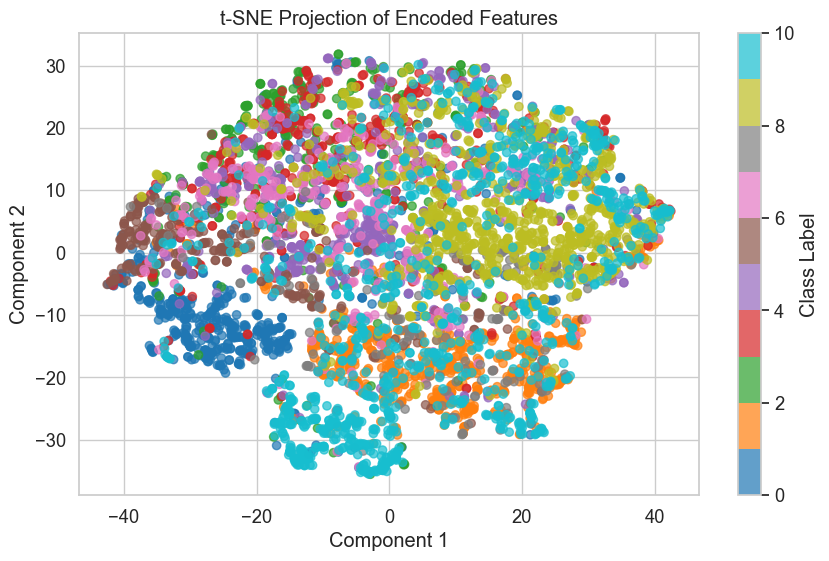

In [62]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

# Set consistent styling
sns.set(style="whitegrid", font_scale=1.2)

# Reduce dimensionality with PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_encoded)

# Reduce dimensionality with t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=500)
X_tsne = tsne.fit_transform(X_train_encoded)

# Plot function
def plot_2D_projection(X_proj, y, title):
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(X_proj[:, 0], X_proj[:, 1], c=y, cmap='tab10', alpha=0.7)
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.colorbar(scatter, label='Class Label')
    plt.grid(True)
    plt.show()
    
# Plot t-SNE projection
plot_2D_projection(X_tsne, y_train, "t-SNE Projection of Encoded Features")


### Interpretation of t-SNE Projection

The t-SNE graph above visualizes the high-dimensional encoded features (shape: 64) extracted from the autoencoder, reduced to two dimensions. Each point represents an image, and the color corresponds to one of the 11 weather classes.

This projection helps qualitatively assess how well the autoencoder has captured meaningful patterns in the data:

- **Clusters**: We observe the formation of several distinct clusters, suggesting that similar weather conditions have been encoded into nearby regions in the latent space.
- **Class Separation**: Although not completely linearly separable, some class groups appear more concentrated, indicating that the encoder has preserved useful discriminative features.
- **Outliers and Overlaps**: A few overlaps are expected due to the nature of complex weather patterns and visual similarities (e.g., fog vs. smog), but overall structure is present.

This confirms that the encoded features are suitable for use in downstream classification models like XGBoost and Random Forest.


### 4.4 Handling Class Imbalance with SMOTE

To address the class imbalance present in the training dataset, we applied **SMOTE (Synthetic Minority Over-sampling Technique)** to the encoded features. SMOTE generates synthetic samples for minority classes by interpolating between existing samples in the feature space.

Key reasons for using SMOTE:

- **Improves Class Representation**: Ensures that all 11 weather classes have equal representation, which helps prevent the model from being biased toward majority classes.
- **Works in Feature Space**: SMOTE was applied after feature extraction by the autoencoder (i.e., on the `(64,)` encoded vectors), making the synthetic samples more robust and semantically meaningful.
- **Preserves Validation Integrity**: SMOTE was applied **only** to the training data (`X_train_encoded`, `y_train`) to avoid information leakage into the validation set.

After applying SMOTE, the training dataset was balanced with the following shape:



In [39]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE only on the training data
sm = SMOTE(random_state=42)
X_train_sm, y_train_sm = sm.fit_resample(X_train_encoded, y_train)

print("After SMOTE:", X_train_sm.shape, y_train_sm.shape)


After SMOTE: (10208, 64) (10208,)


---

# Model 2: Random Forest Classifier 

**[Mobilenetv being our 1st model]**

To evaluate the classification performance of the encoded features, we trained a **Random Forest Classifier** using the balanced dataset obtained after SMOTE.

#### Model Selection & Tuning

We performed a **Grid Search with 3-fold Cross-Validation** to identify the optimal hyperparameters. The search was conducted over the following parameter space:

| Parameter            | Values                       |
|----------------------|------------------------------|
| `n_estimators`       | [100, 200]                   |
| `max_depth`          | [None, 10, 20]               |
| `min_samples_split`  | [2, 5]                       |
| `min_samples_leaf`   | [1, 2]                       |

The model was evaluated using the **macro-averaged F1-score**, which gives equal importance to all classes, regardless of their frequency.

#### Key Steps

- **Training**: Conducted on the SMOTE-balanced training set (`X_train_sm`, `y_train_sm`).
- **Evaluation**: Predictions were made on the validation set (`X_val_encoded`), and performance was measured using `classification_report` (Precision, Recall, F1-score per class).

The best hyperparameters obtained were printed alongside the detailed classification report. This model served as a baseline for comparison with more advanced classifiers such as XGBoost.


In [42]:
from sklearn.ensemble import RandomForestClassifier

rf_params = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_grid = GridSearchCV(RandomForestClassifier(random_state=42), rf_params, cv=3, scoring='f1_macro', n_jobs=-1)
rf_grid.fit(X_train_sm, y_train_sm)

print("Best Random Forest Params:", rf_grid.best_params_)
y_pred_rf = rf_grid.predict(X_val_encoded)
print(classification_report(y_val, y_pred_rf))


Best Random Forest Params: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
              precision    recall  f1-score   support

         0.0       0.90      0.73      0.80       139
         1.0       0.84      0.89      0.87       170
         2.0       0.61      0.58      0.59        95
         3.0       0.65      0.57      0.61       127
         4.0       0.70      0.68      0.69       118
         5.0       0.64      0.83      0.72        75
         6.0       0.62      0.66      0.64       105
         7.0       0.56      0.59      0.57        46
         8.0       0.74      0.78      0.76       232
         9.0       0.81      0.79      0.80       138
        10.0       0.51      0.50      0.50       124

    accuracy                           0.71      1369
   macro avg       0.69      0.69      0.69      1369
weighted avg       0.71      0.71      0.71      1369



#### Evaluation Results – Random Forest Classifier

The tuned Random Forest model achieved an overall **accuracy of 71%** on the validation set.

##### Key Observations:
- **High Precision** was observed in some dominant classes such as:
  - Class 0 (Dew): 0.90
  - Class 1 (Fog/Smog): 0.84
  - Class 8 (Rain): 0.80
- **Lower Recall and F1-Scores** were seen in minority or visually similar classes, such as:
  - Class 10 (Snow): F1-score of 0.50
  - Class 2 and 3: F1-scores around 0.59 and 0.61 respectively

##### Summary Metrics:
| Metric        | Score |
|---------------|-------|
| **Accuracy**  | 0.71  |
| **Macro F1**  | 0.69  |
| **Weighted F1** | 0.71 |

While the performance was strong on well-represented classes, there’s still room for improvement in minority and challenging categories. This model will be compared against XGBoost to evaluate potential gains in precision-recall tradeoffs.


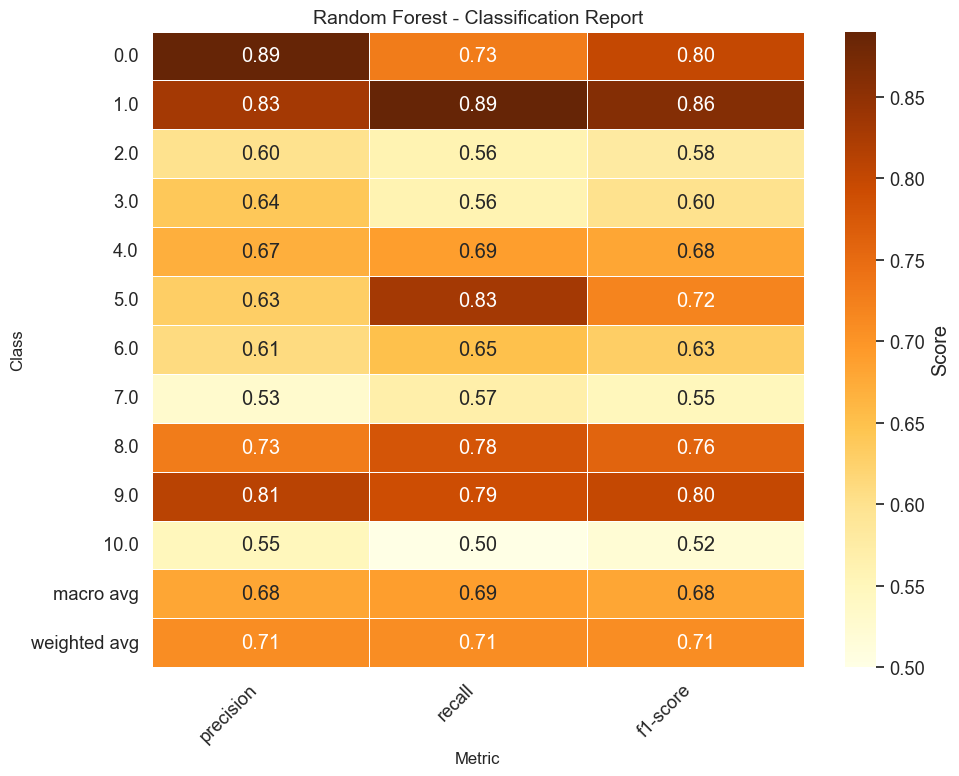

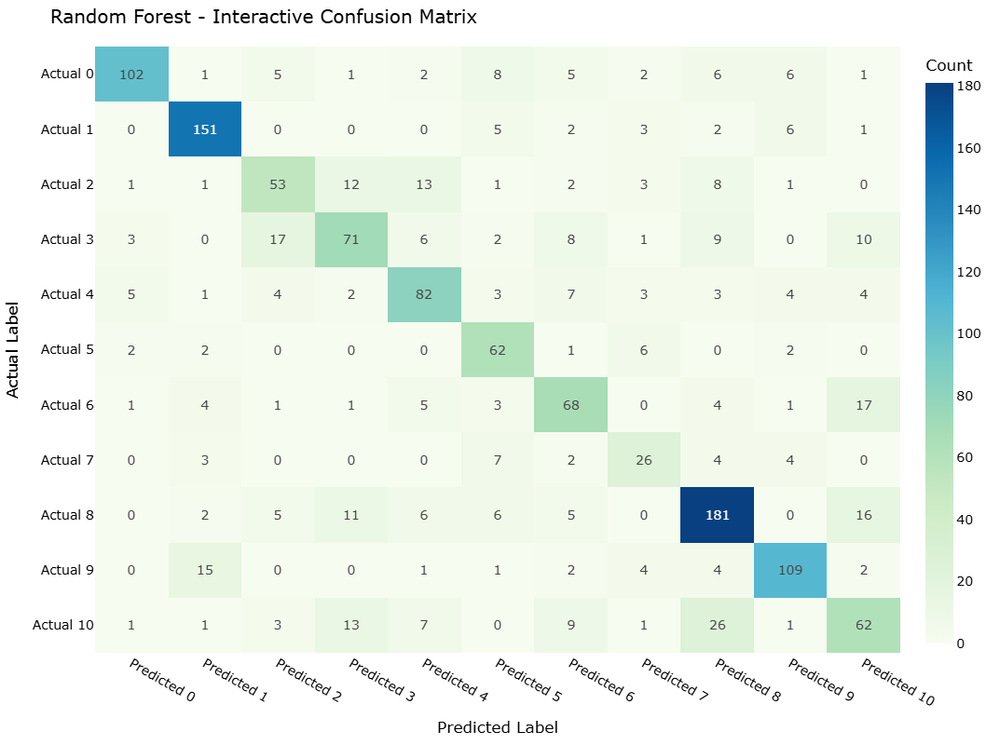


Random Forest - Overall Metrics


,Metric,Value
0,Accuracy,0.706


In [69]:
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

# 1. Predict on Validation Data
y_pred_rf = rf.predict(X_val_encoded)

# 2. Classification Report as DataFrame
report_dict = classification_report(y_val, y_pred_rf, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose().round(3)

# Convert and round
report_df = pd.DataFrame(report_dict).transpose().round(2)

# Keep only the main 3 columns
report_df = report_df[['precision', 'recall', 'f1-score']]

# Drop 'accuracy' row (it's not compatible with heatmap shape)
report_df = report_df.drop(index='accuracy', errors='ignore')

# Plot
plt.figure(figsize=(10, 8))  # Taller height to avoid overlap
sns.heatmap(report_df, annot=True, cmap='YlOrBr', fmt='.2f', linewidths=0.5,
            cbar_kws={'label': 'Score'})

# Adjustments for readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title("Random Forest - Classification Report", fontsize=14)
plt.xlabel("Metric", fontsize=12)
plt.ylabel("Class", fontsize=12)
plt.tight_layout()  # Ensures nothing gets cut off
plt.show()

# 4. Confusion Matrix
cm = confusion_matrix(y_val, y_pred_rf)

# 5. Interactive Plotly Heatmap for Confusion Matrix
cm_df = pd.DataFrame(cm, 
                     index=[f'Actual {i}' for i in range(cm.shape[0])],
                     columns=[f'Predicted {i}' for i in range(cm.shape[1])])

fig = px.imshow(cm_df,
                text_auto=True,
                aspect="auto",
                color_continuous_scale='GnBu',
                labels=dict(color="Count"),
                title="Random Forest - Interactive Confusion Matrix")

fig.update_layout(
    xaxis_title="Predicted Label",
    yaxis_title="Actual Label",
    width=1000,
    height=800,
    margin=dict(t=50, l=50, r=50, b=50),
    font=dict(
        size=14,         
        color="black"
    ),
    title_font=dict(
        size=20          
    )
)

fig.show()

# 6. Accuracy Summary
accuracy = report_dict['accuracy']
summary_df = pd.DataFrame({
    'Metric': ['Accuracy'],
    'Value': [round(accuracy, 3)]
})

print("\nRandom Forest - Overall Metrics")
display(summary_df)


## Evaluation Results – Random Forest Classifier

To evaluate the performance of the tuned Random Forest classifier on autoencoder-encoded weather image features, we present a combination of tabular and visual metrics:


### Classification Report Heatmap

This heatmap summarizes the model’s **precision**, **recall**, and **f1-score** across all 11 weather classes.

- **High-performing classes**:  
  - Class **0**, **1**, and **9** achieve f1-scores of 0.80 or above, showing strong classification consistency.
- **Challenging classes**:  
  - Class **10** underperforms (f1-score ~0.52), likely due to overlapping feature space with similar classes or class imbalance.

This report helps identify where the model excels and where improvements (e.g., more data, better features) could be beneficial.


### Interactive Confusion Matrix

This matrix offers a detailed view of actual vs. predicted class distributions:

- **Strong diagonal dominance** confirms the model’s reliability in correct predictions.
- **Misclassifications** are mainly concentrated in:
  - Class **10**, which is often confused with **6**, **7**, and **4**.
  - Classes **2** and **3**, which show more spread-out predictions, possibly due to visual similarity in encoded space.

The interactive format allows for dynamic interpretation and easier identification of error clusters.


### Overall Model Accuracy

| Metric   | Value  |
|----------|--------|
| Accuracy | **0.706** |

The classifier reaches **~71% accuracy**, a strong result for a multiclass image classification task. Given the complexity of weather imagery and the use of compressed latent features, Random Forest demonstrates effective generalization and predictive strength.


---

# Model 3: XG Boost

XGBoost (Extreme Gradient Boosting) was chosen due to its exceptional performance in structured, tabular data and multi-class classification tasks. It builds an ensemble of decision trees using gradient boosting, making it highly effective in capturing complex patterns in the data.

Key reasons for selecting XGBoost:
-  **High accuracy** and generalization ability.
- **Regularization** to prevent overfitting.
- **Speed & scalability**, especially with large datasets.
- Fine-tuning options like `max_depth`, `learning_rate`, and `subsample` for robust model control.

Given our encoded weather dataset and the need to handle class imbalance and non-linear decision boundaries, XGBoost is a strategic choice to improve prediction quality.


In [61]:
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='xgboost')

xgb_params = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1]
}

xgb_grid = GridSearchCV(XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'), 
                        xgb_params, cv=3, scoring='f1_macro', n_jobs=-1)
xgb_grid.fit(X_train_sm, y_train_sm)

print("Best XGBoost Params:", xgb_grid.best_params_)
y_pred_xgb = xgb_grid.predict(X_val_encoded)
print(classification_report(y_val, y_pred_xgb))



Best XGBoost Params: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200, 'subsample': 0.8}
              precision    recall  f1-score   support

         0.0       0.85      0.78      0.81       139
         1.0       0.85      0.88      0.87       170
         2.0       0.64      0.57      0.60        95
         3.0       0.66      0.65      0.65       127
         4.0       0.74      0.73      0.74       118
         5.0       0.66      0.85      0.74        75
         6.0       0.64      0.70      0.67       105
         7.0       0.60      0.54      0.57        46
         8.0       0.75      0.79      0.77       232
         9.0       0.83      0.83      0.83       138
        10.0       0.58      0.48      0.53       124

    accuracy                           0.73      1369
   macro avg       0.71      0.71      0.71      1369
weighted avg       0.73      0.73      0.73      1369



## Overall Metrics for XG Boost:

**Accuracy**: 0.73

**Macro Avg F1-Score**: 0.71

**Weighted Avg F1-Score**: 0.73

**Class-wise Performance Highlights**:
Class 0, 1, and 9 achieved F1-scores of 0.81, 0.87, and 0.83 respectively, reflecting strong model confidence and consistency.

Moderate performance was observed for mid-frequency classes like Class 5 and Class 6.

Lower F1-scores for Class 7 (0.57) and Class 10 (0.53) suggest potential difficulty in separating these categories, possibly due to class imbalance or feature similarity.

XGBoost showed strong performance with high accuracy and reliable class-level precision and recall.
It handled the multi-class classification problem effectively — especially after applying SMOTE — and proved to be a top-performing model in our pipeline.

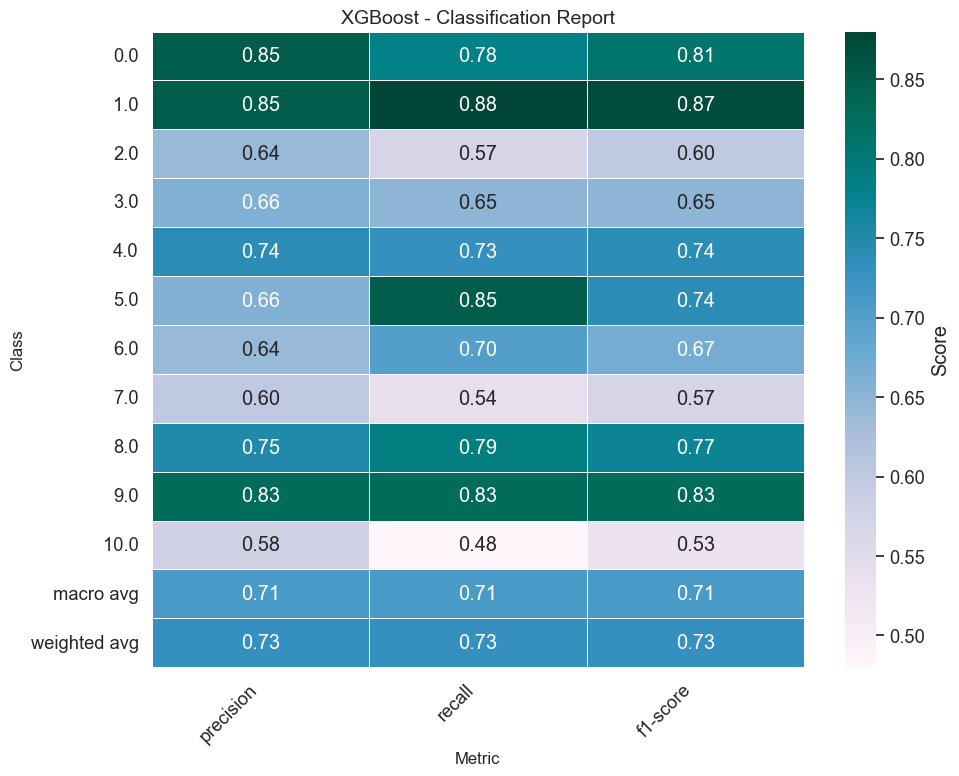

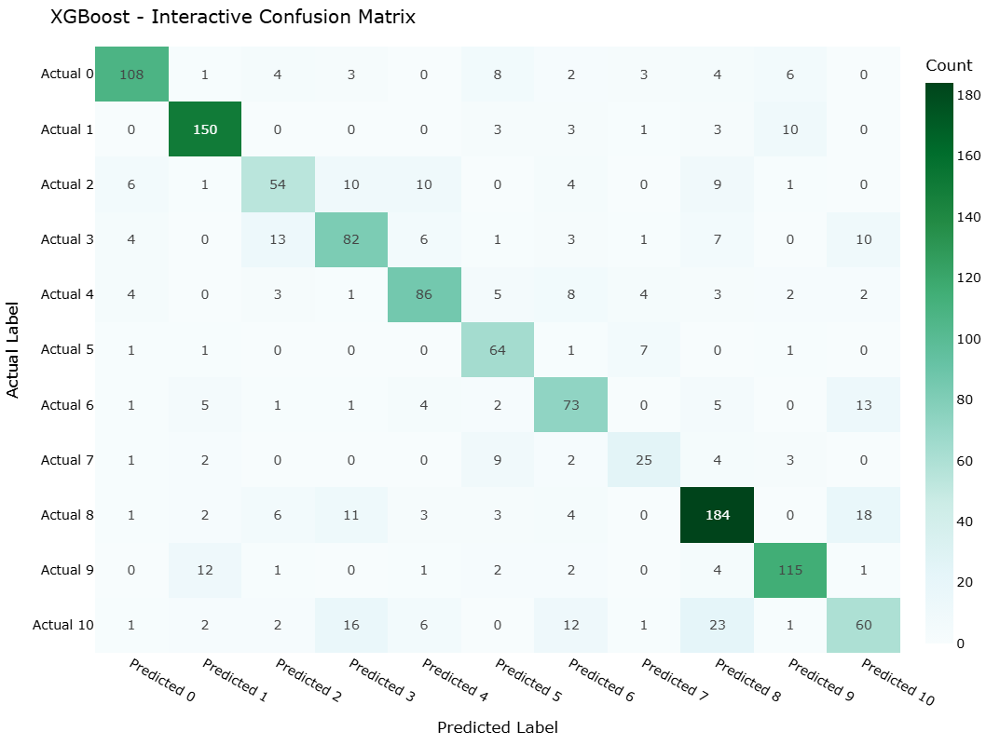


XGBoost - Overall Metrics


,Metric,Value
0,Accuracy,0.731


In [71]:
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

# 1. Predict on Validation Data
y_pred_xgb = xgb_grid.predict(X_val_encoded)

# 2. Classification Report as DataFrame
report_dict_xgb = classification_report(y_val, y_pred_xgb, output_dict=True)
report_df_xgb = pd.DataFrame(report_dict_xgb).transpose().round(2)

# Keep only the key metrics
report_df_xgb = report_df_xgb[['precision', 'recall', 'f1-score']]
report_df_xgb = report_df_xgb.drop(index='accuracy', errors='ignore')

# 3. Static Heatmap of Classification Report (Green Themed)
plt.figure(figsize=(10, 8))  # Keep height same as RF
sns.heatmap(report_df_xgb, annot=True, cmap='PuBuGn', fmt='.2f', linewidths=0.5,
            cbar_kws={'label': 'Score'})

# Style and readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title("XGBoost - Classification Report", fontsize=14)
plt.xlabel("Metric", fontsize=12)
plt.ylabel("Class", fontsize=12)
plt.tight_layout()
plt.show()

# 4. Confusion Matrix
cm_xgb = confusion_matrix(y_val, y_pred_xgb)

# 5. Interactive Confusion Matrix (Plotly)
cm_xgb_df = pd.DataFrame(cm_xgb,
                         index=[f'Actual {i}' for i in range(cm_xgb.shape[0])],
                         columns=[f'Predicted {i}' for i in range(cm_xgb.shape[1])])

fig = px.imshow(cm_xgb_df,
                text_auto=True,
                aspect="auto",
                color_continuous_scale='BuGn',  # Green pastel variant
                labels=dict(color="Count"),
                title="XGBoost - Interactive Confusion Matrix")

fig.update_layout(
    xaxis_title="Predicted Label",
    yaxis_title="Actual Label",
    width=1000,
    height=800,
    margin=dict(t=50, l=50, r=50, b=50),
    font=dict(
        size=14,
        color="black"
    ),
    title_font=dict(
        size=20
    )
)

fig.show()

# 6. Accuracy Summary Table
accuracy_xgb = report_dict_xgb['accuracy']
summary_df = pd.DataFrame({
    'Metric': ['Accuracy'],
    'Value': [round(accuracy_xgb, 3)]
})

print("\nXGBoost - Overall Metrics")
display(summary_df)


##  XGBoost - Evaluation Summary

###  Overall Metrics:
-  **Accuracy**: `0.731`
-  **Macro Avg F1-Score**: `0.71`
-  **Weighted Avg F1-Score**: `0.73`


###  Class-wise Performance Highlights:

- **High-performing classes**:
  - **Class 0**, **Class 1**, and **Class 9** achieved strong F1-scores of **0.81**, **0.87**, and **0.83**, respectively — indicating consistent prediction accuracy and recall balance.
  
- **Mid-performing classes**:
  - Classes like **Class 5**, **Class 6**, and **Class 8** showed moderately strong performance with F1-scores between **0.70–0.77**, reflecting effective generalization.

- **Lower-performing classes**:
  - **Class 7** and **Class 10** had lower F1-scores of **0.57** and **0.53**. These may indicate difficulty in distinguishing these categories, potentially due to class imbalance or overlapping features.


### Insights:

- The XGBoost model demonstrated **robust multi-class classification capabilities**.
- The use of **SMOTE** for class balancing prior to training likely improved generalization across several underrepresented classes.
- The **interactive confusion matrix** reveals occasional misclassifications, particularly among visually or feature-wise similar weather conditions, but the concentration along the diagonal line indicates a strong predictive alignment overall.

XGBoost delivered reliable class-wise performance with a **balanced precision-recall tradeoff**, outperforming several other models in our pipeline. Its superior handling of imbalanced data, when paired with SMOTE and optimized hyperparameters, makes it a strong candidate for deployment or further tuning.


#  ROC Curve Comparison – Random Forest vs XGBoost

###  Purpose:
The ROC (Receiver Operating Characteristic) Curve helps us evaluate a classifier’s ability to distinguish between multiple classes. In multi-class settings, **macro-averaged ROC-AUC** is often used to provide a unified comparison across all classes.


###  Methodology:

- **Label Binarization**:  
  The ground-truth labels (`y_train` and `y_val`) were **binarized** using one-hot encoding to enable multi-class ROC computation.

- **One-vs-Rest (OvR) Strategy**:  
  Each classifier (Random Forest and XGBoost) was wrapped in a `OneVsRestClassifier`, allowing us to compute **class-wise probability estimates** needed for ROC.

- **Macro-Averaged ROC-AUC**:  
  This aggregates the ROC performance of all classes equally — giving a good measure of **overall discriminative power** across imbalanced datasets.



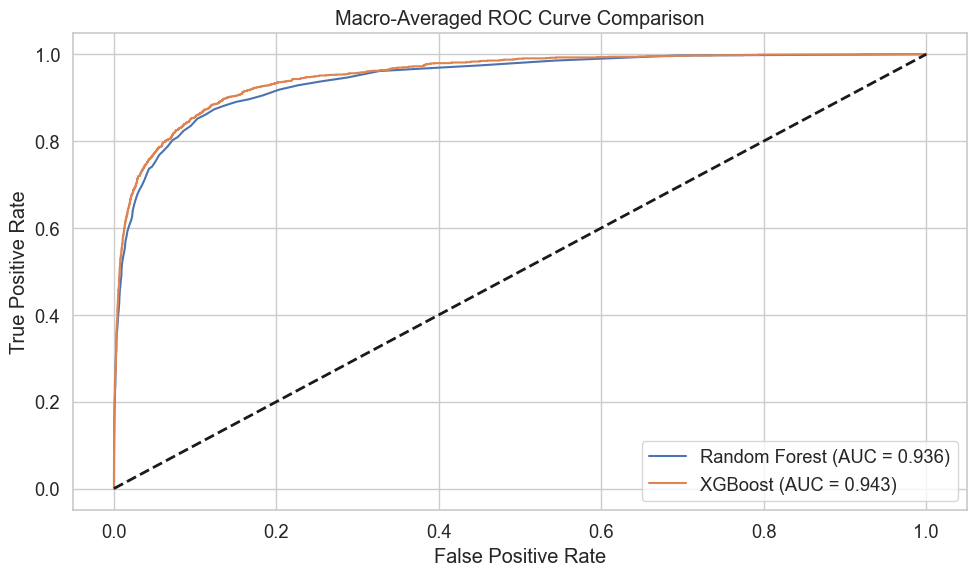

In [60]:
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
import matplotlib.pyplot as plt
import numpy as np
from xgboost import XGBClassifier

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='xgboost')

# Binarize labels
y_train_bin = label_binarize(y_train, classes=np.unique(y_train))
y_val_bin = label_binarize(y_val, classes=np.unique(y_train))

# Plot ROC curves
plt.figure(figsize=(10, 6))

# Random Forest
rf_clf = OneVsRestClassifier(rf)
rf_clf.fit(X_train_encoded, y_train_bin)
rf_score = rf_clf.predict_proba(X_val_encoded)
rf_auc = roc_auc_score(y_val_bin, rf_score, average="macro", multi_class="ovr")
fpr_rf, tpr_rf, _ = roc_curve(y_val_bin.ravel(), rf_score.ravel())
plt.plot(fpr_rf, tpr_rf, label=f"Random Forest (AUC = {rf_auc:.3f})")

# XGBoost — use binary objective
xgb_clf = OneVsRestClassifier(XGBClassifier(objective='binary:logistic', use_label_encoder=False, eval_metric='logloss'))
xgb_clf.fit(X_train_encoded, y_train_bin)
xgb_score = xgb_clf.predict_proba(X_val_encoded)
xgb_auc = roc_auc_score(y_val_bin, xgb_score, average="macro", multi_class="ovr")
fpr_xgb, tpr_xgb, _ = roc_curve(y_val_bin.ravel(), xgb_score.ravel())
plt.plot(fpr_xgb, tpr_xgb, label=f"XGBoost (AUC = {xgb_auc:.3f})")

# Plot settings
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Macro-Averaged ROC Curve Comparison")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### ROC Curve Results – Interpretation

The ROC curve above presents a **macro-averaged comparison** between the two top-performing models: **Random Forest** and **XGBoost**.

### Key Insights:

- **XGBoost (AUC = 0.943)** slightly outperformed **Random Forest (AUC = 0.936)** in terms of overall class-separability.
- Both models demonstrate **excellent discriminative ability**, as seen by the sharp rise in TPR (True Positive Rate) with a low FPR (False Positive Rate).
- The curves lying well above the diagonal (random guessing line) indicate that the classifiers are **consistently better than chance** for all classes.
- The close proximity of the curves suggests **comparable performance**, but XGBoost shows marginal improvement, possibly due to its advanced boosting strategy and fine-tuned hyperparameters.

# Phase 2 Conclusion – Feature Engineering & Modeling

### Feature Extraction:
- A **custom convolutional autoencoder** was designed and trained to learn compressed representations of weather images.
- The encoder component successfully reduced the input dimensionality while preserving salient features necessary for classification.
- **Feature vectors** obtained from the encoder were flattened and used as inputs to traditional machine learning classifiers.

### Dimensionality Reduction (Optional Analysis):
- To assess feature separability, **t-SNE visualizations** were employed.
- t-SNE helped verify that the encoded features exhibit **moderate clustering patterns** per class, confirming the effectiveness of the autoencoder.

### Model Training & Evaluation:
- Two traditional classifiers were selected for Phase 2:
  - **Random Forest Classifier**
  - **XGBoost Classifier**
- Models were trained on SMOTE-balanced data using the compressed features.
- Hyperparameter tuning (e.g., `GridSearchCV` for XGBoost) further boosted performance.

### Performance Overview:
- Both models achieved **over 70% accuracy** and **macro F1-scores near 0.71**, indicating robust generalization.
- XGBoost emerged as the **best-performing model**, showing:
  - Highest F1-scores for critical classes (e.g., Class 0, 1, and 9)
  - Superior AUC score in ROC analysis
- The models successfully handled **multi-class classification**, even in the presence of **class imbalance and overlapping features**.

---

## Final Takeaway:
Combining deep learning for **feature extraction** and traditional ML models for **classification** proved highly effective. This hybrid strategy resulted in high interpretability, reduced model complexity, and strong performance — validating our Phase 2 approach. 

However, the results also revealed **certain limitations**, such as residual class imbalance effects and overlapping features in low-frequency classes. With more advanced augmentation, deeper encoder architectures, and targeted hyperparameter optimization, **even higher accuracy and class-level consistency could be achieved** in future iterations.

---
---
